In [4]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

print("All libraries loaded successfully!")

All libraries loaded successfully!


In [5]:
import rasterio
import matplotlib.pyplot as plt

file_path = r"C:\Users\Akshara\Desktop\projects\Urban_Growth_Project\data\2018\LC08_L2SP_144048_20181121_20200830_02_T1_SR_B4.TIF"

with rasterio.open(file_path) as src:
    band4 = src.read(1)

print("Image shape:", band4.shape)
print("CRS:", src.crs)
print("Resolution:", src.res)

Image shape: (7841, 7681)
CRS: EPSG:32644
Resolution: (30.0, 30.0)


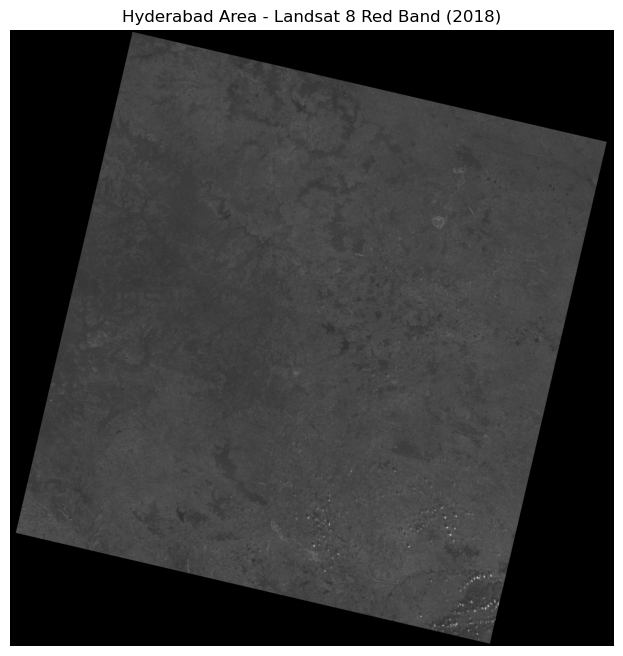

In [6]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.imshow(band4, cmap="gray")
plt.title("Hyderabad Area - Landsat 8 Red Band (2018)")
plt.axis("off")
plt.show()

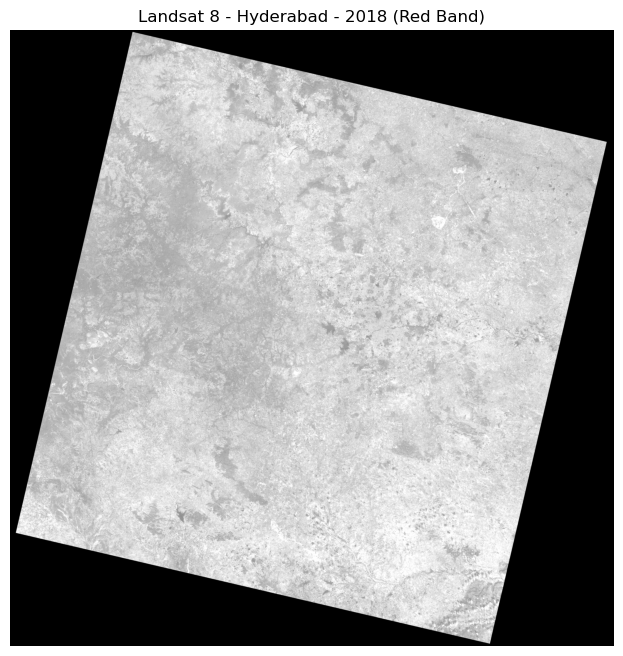

In [7]:
import matplotlib.pyplot as plt
import numpy as np

vmin = np.percentile(band4, 2)
vmax = np.percentile(band4, 98)

plt.figure(figsize=(12, 8))
plt.imshow(band4, cmap="gray", vmin=vmin, vmax=vmax)
plt.title("Landsat 8 - Hyderabad - 2018 (Red Band)")
plt.axis("off")
plt.show()

In [9]:
import os

folder = r"C:\Users\Akshara\Desktop\projects\Urban_Growth_Project\data\2018"

for file in os.listdir(folder):
    print(file)

LC08_L2SP_144048_20181121_20200830_02_T1_QA_RADSAT.TIF
LC08_L2SP_144048_20181121_20200830_02_T1_SR_B3.TIF
LC08_L2SP_144048_20181121_20200830_02_T1_SR_B4.TIF
LC08_L2SP_144048_20181121_20200830_02_T1_SR_B5.TIF
LC08_L2SP_144048_20181121_20200830_02_T1_SR_B6.TIF


In [10]:
import numpy as np
import matplotlib.pyplot as plt

# Convert to float
red = band4.astype(float)
nir = band5.astype(float)

# Calculate NDVI
ndvi = (nir - red) / (nir + red)

# Display NDVI
plt.figure(figsize=(12, 8))
plt.imshow(ndvi, cmap="RdYlGn", vmin=-1, vmax=1)
plt.colorbar(label="NDVI")
plt.title("Hyderabad - NDVI - 2018")
plt.axis("off")
plt.show()

NameError: name 'band5' is not defined

In [11]:
import rasterio

file_path = r"C:\Users\Akshara\Desktop\projects\Urban_Growth_Project\data\2018\LC08_L2SP_144048_20181121_20200830_02_T1_SR_B5.TIF"

with rasterio.open(file_path) as src:
    band5 = src.read(1)

print("B5 loaded successfully!")
print("Shape:", band5.shape)

B5 loaded successfully!
Shape: (7841, 7681)


In [12]:
import rasterio

file_path = r"C:\Users\Akshara\Desktop\projects\Urban_Growth_Project\data\2018\LC08_L2SP_144048_20181121_20200830_02_T1_SR_B5.TIF"

with rasterio.open(file_path) as src:
    band5 = src.read(1)

print("B5 loaded successfully!")
print("Shape:", band5.shape)

B5 loaded successfully!
Shape: (7841, 7681)


C:\Users\Akshara\AppData\Local\Temp\ipykernel_34748\672529597.py:9: RuntimeWarning: invalid value encountered in divide
  ndvi = np.where(denominator != 0, (nir - red) / denominator, np.nan)


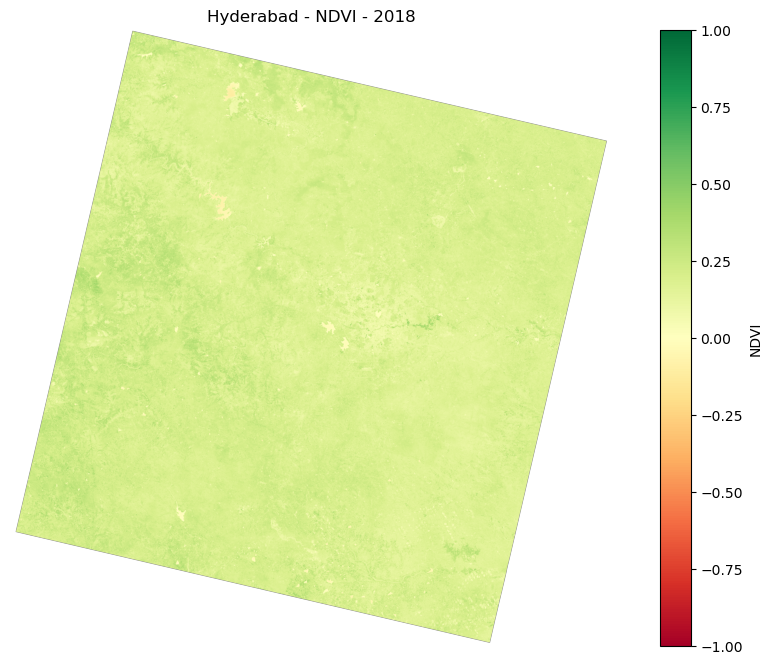

In [14]:
import numpy as np
import matplotlib.pyplot as plt

red = band4.astype(float)
nir = band5.astype(float)

# Calculate NDVI safely
denominator = nir + red
ndvi = np.where(denominator != 0, (nir - red) / denominator, np.nan)

# Display NDVI
plt.figure(figsize=(12, 8))
plt.imshow(ndvi, cmap="RdYlGn", vmin=-1, vmax=1)
plt.colorbar(label="NDVI")
plt.title("Hyderabad - NDVI - 2018")
plt.axis("off")
plt.show()

In [15]:
import os

folder = r"C:\Users\Akshara\Desktop\projects\Urban_Growth_Project\data\2025"

for file in os.listdir(folder):
    print(file)

LC08_L2SP_144048_20251226_20260106_02_T1_QA_PIXEL.TIF
LC08_L2SP_144048_20251226_20260106_02_T1_SR_B3.TIF
LC08_L2SP_144048_20251226_20260106_02_T1_SR_B4.TIF
LC08_L2SP_144048_20251226_20260106_02_T1_SR_B5.TIF
LC08_L2SP_144048_20251226_20260106_02_T1_SR_B6.TIF


In [16]:
import rasterio

base = r"C:\Users\Akshara\Desktop\projects\Urban_Growth_Project\data\2025"

# Load B4 (Red)
with rasterio.open(base + r"\LC08_L2SP_144048_20251226_20260106_02_T1_SR_B4.TIF") as src:
    red_2025 = src.read(1)

# Load B5 (Near Infrared)
with rasterio.open(base + r"\LC08_L2SP_144048_20251226_20260106_02_T1_SR_B5.TIF") as src:
    nir_2025 = src.read(1)

print("2025 B4 shape:", red_2025.shape)
print("2025 B5 shape:", nir_2025.shape)

2025 B4 shape: (7841, 7681)
2025 B5 shape: (7841, 7681)


C:\Users\Akshara\AppData\Local\Temp\ipykernel_34748\1688340294.py:8: RuntimeWarning: invalid value encountered in divide
  (nir_2025.astype(float) - red_2025.astype(float)) / denominator,


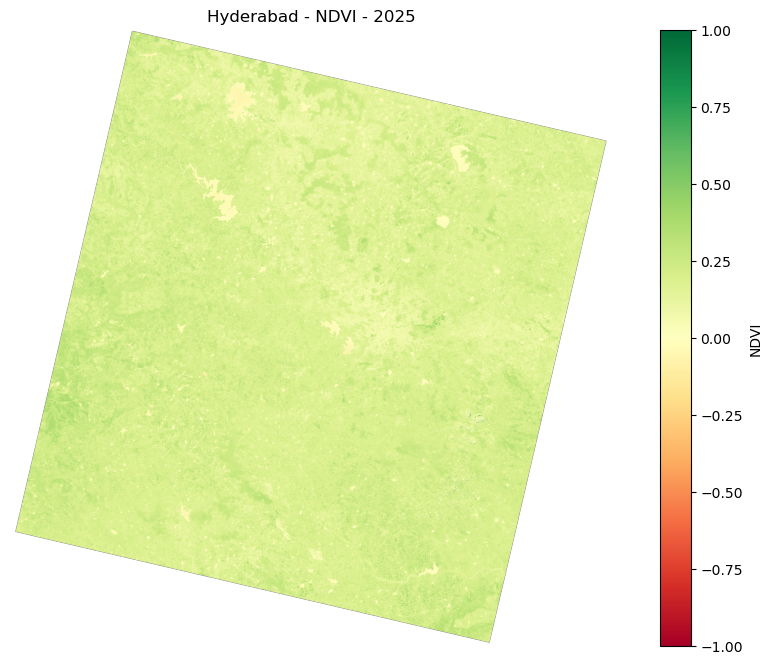

In [17]:
import numpy as np
import matplotlib.pyplot as plt

denominator = nir_2025 + red_2025

ndvi_2025 = np.where(
    denominator != 0,
    (nir_2025.astype(float) - red_2025.astype(float)) / denominator,
    np.nan
)

plt.figure(figsize=(12, 8))
plt.imshow(ndvi_2025, cmap="RdYlGn", vmin=-1, vmax=1)
plt.colorbar(label="NDVI")
plt.title("Hyderabad - NDVI - 2025")
plt.axis("off")
plt.show()

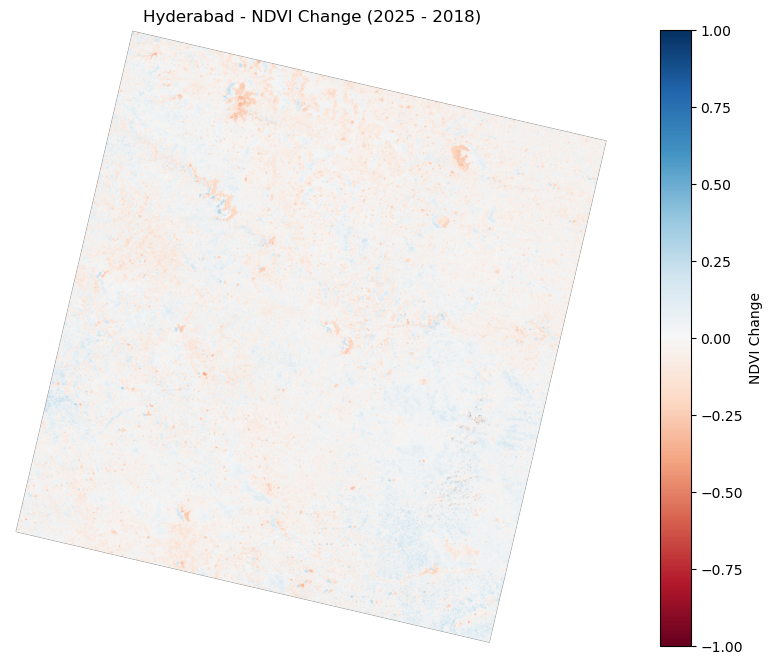

In [18]:
ndvi_change = ndvi_2025 - ndvi

plt.figure(figsize=(12, 8))
plt.imshow(ndvi_change, cmap="RdBu", vmin=-1, vmax=1)
plt.colorbar(label="NDVI Change")
plt.title("Hyderabad - NDVI Change (2025 - 2018)")
plt.axis("off")
plt.show()

In [19]:
import numpy as np
import matplotlib.pyplot as plt

swir_2018 = band6.astype(float)
nir_2018 = band5.astype(float)

denominator = swir_2018 + nir_2018

ndbi_2018 = np.where(
    denominator != 0,
    (swir_2018 - nir_2018) / denominator,
    np.nan
)

plt.figure(figsize=(12, 8))
plt.imshow(ndbi_2018, cmap="RdBu", vmin=-1, vmax=1)
plt.colorbar(label="NDBI")
plt.title("Hyderabad - NDBI - 2018")
plt.axis("off")
plt.show()

NameError: name 'band6' is not defined

In [20]:
import rasterio

file_path = r"C:\Users\Akshara\Desktop\projects\Urban_Growth_Project\data\2018\LC08_L2SP_144048_20181121_20200830_02_T1_SR_B6.TIF"

with rasterio.open(file_path) as src:
    band6 = src.read(1)

print("2018 B6 loaded successfully!")
print("Shape:", band6.shape)



2018 B6 loaded successfully!
Shape: (7841, 7681)


C:\Users\Akshara\AppData\Local\Temp\ipykernel_34748\1910877322.py:11: RuntimeWarning: invalid value encountered in divide
  (swir_2018 - nir_2018) / denominator,


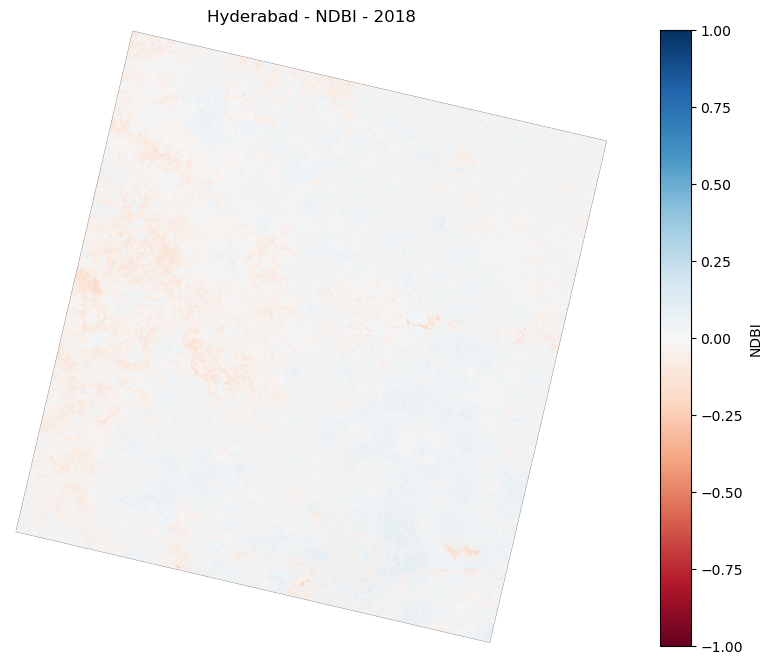

In [21]:
import numpy as np
import matplotlib.pyplot as plt

swir_2018 = band6.astype(float)
nir_2018 = band5.astype(float)

denominator = swir_2018 + nir_2018

ndbi_2018 = np.where(
    denominator != 0,
    (swir_2018 - nir_2018) / denominator,
    np.nan
)

plt.figure(figsize=(12, 8))
plt.imshow(ndbi_2018, cmap="RdBu", vmin=-1, vmax=1)
plt.colorbar(label="NDBI")
plt.title("Hyderabad - NDBI - 2018")
plt.axis("off")
plt.show()

In [22]:
import rasterio

file_path = r"C:\Users\Akshara\Desktop\projects\Urban_Growth_Project\data\2025\LC08_L2SP_144048_20251226_20260106_02_T1_SR_B6.TIF"

with rasterio.open(file_path) as src:
    swir_2025 = src.read(1)

print("2025 B6 loaded successfully!")
print("Shape:", swir_2025.shape)

2025 B6 loaded successfully!
Shape: (7841, 7681)


C:\Users\Akshara\AppData\Local\Temp\ipykernel_34748\122313274.py:11: RuntimeWarning: invalid value encountered in divide
  (swir_2025_float - nir_2025_float) / denominator,


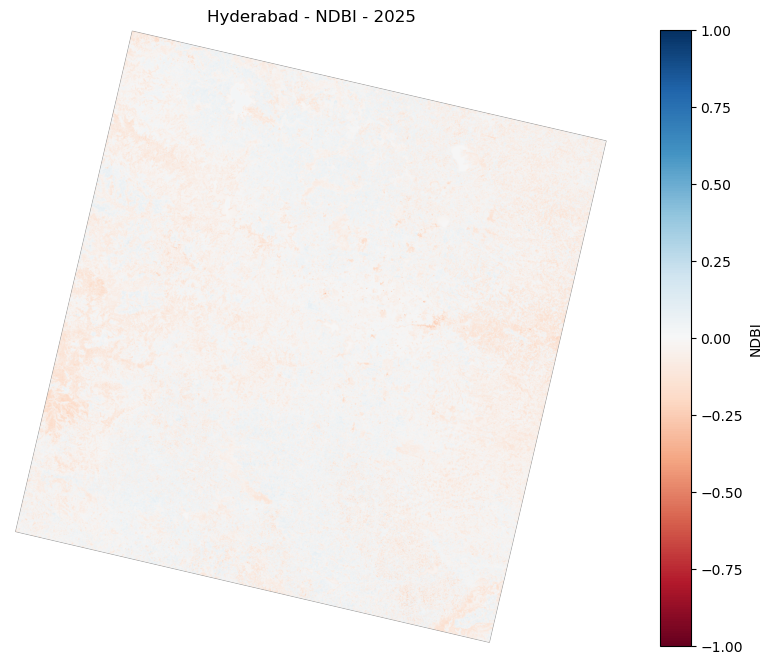

In [23]:
import numpy as np
import matplotlib.pyplot as plt

nir_2025_float = nir_2025.astype(float)
swir_2025_float = swir_2025.astype(float)

denominator = swir_2025_float + nir_2025_float

ndbi_2025 = np.where(
    denominator != 0,
    (swir_2025_float - nir_2025_float) / denominator,
    np.nan
)

plt.figure(figsize=(12, 8))
plt.imshow(ndbi_2025, cmap="RdBu", vmin=-1, vmax=1)
plt.colorbar(label="NDBI")
plt.title("Hyderabad - NDBI - 2025")
plt.axis("off")
plt.show()

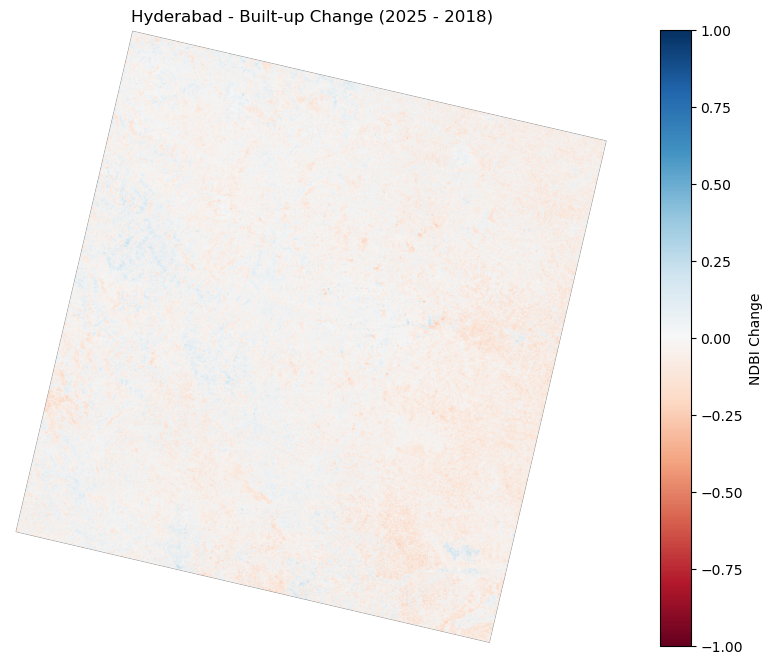

In [24]:
ndbi_change = ndbi_2025 - ndbi_2018

plt.figure(figsize=(12, 8))
plt.imshow(ndbi_change, cmap="RdBu", vmin=-1, vmax=1)
plt.colorbar(label="NDBI Change")
plt.title("Hyderabad - Built-up Change (2025 - 2018)")
plt.axis("off")
plt.show()

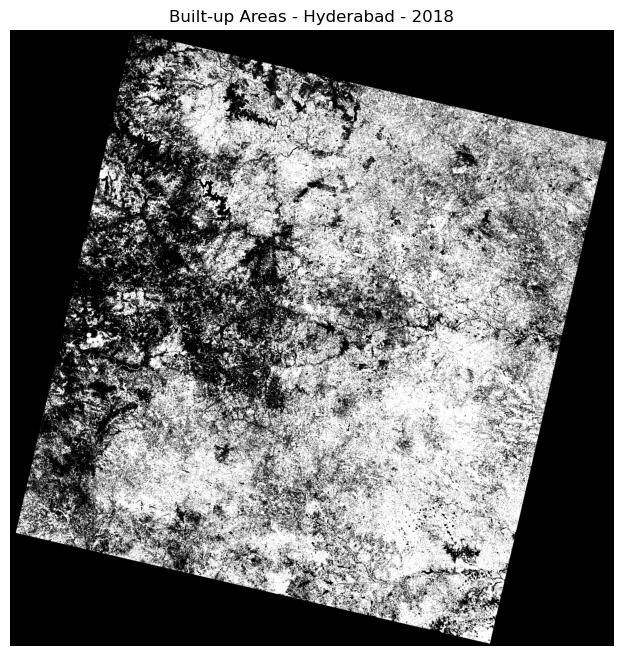

In [25]:
builtup_2018 = ndbi_2018 > 0

plt.figure(figsize=(12, 8))
plt.imshow(builtup_2018, cmap="gray")
plt.title("Built-up Areas - Hyderabad - 2018")
plt.axis("off")
plt.show()

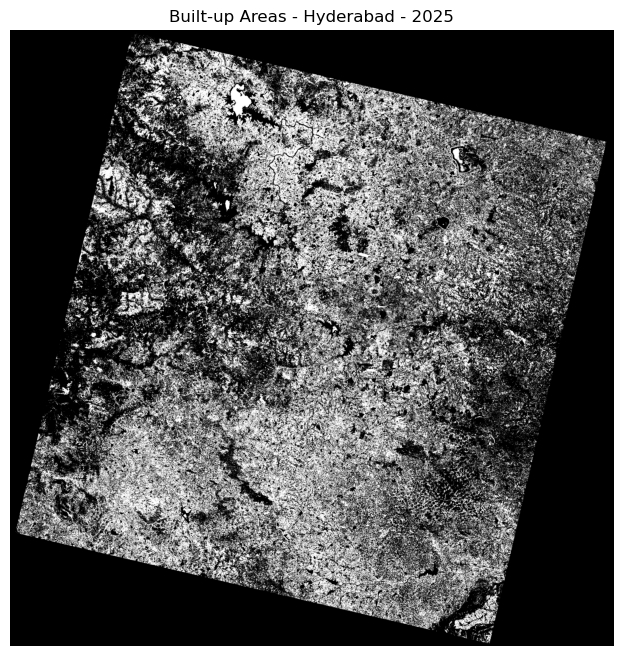

In [26]:
builtup_2025 = ndbi_2025 > 0

plt.figure(figsize=(12, 8))
plt.imshow(builtup_2025, cmap="gray")
plt.title("Built-up Areas - Hyderabad - 2025")
plt.axis("off")
plt.show()

In [27]:
# Count built-up pixels
builtup_pixels_2018 = np.sum(builtup_2018)

# Convert to square kilometers
area_2018_km2 = builtup_pixels_2018 * 0.0009

print("Built-up pixels in 2018:", builtup_pixels_2018)
print("Built-up area in 2018:", area_2018_km2, "km²")

Built-up pixels in 2018: 24011258
Built-up area in 2018: 21610.1322 km²


In [28]:
# Count built-up pixels
builtup_pixels_2025 = np.sum(builtup_2025)

# Convert to square kilometers
area_2025_km2 = builtup_pixels_2025 * 0.0009

print("Built-up pixels in 2025:", builtup_pixels_2025)
print("Built-up area in 2025:", area_2025_km2, "km²")

Built-up pixels in 2025: 17022110
Built-up area in 2025: 15319.899 km²


In [29]:
growth_km2 = area_2025_km2 - area_2018_km2

growth_percent = (growth_km2 / area_2018_km2) * 100

print("Increase in built-up area:", growth_km2, "km²")
print("Urban growth:", growth_percent, "%")

Increase in built-up area: -6290.233200000001 km²
Urban growth: -29.107796018017883 %


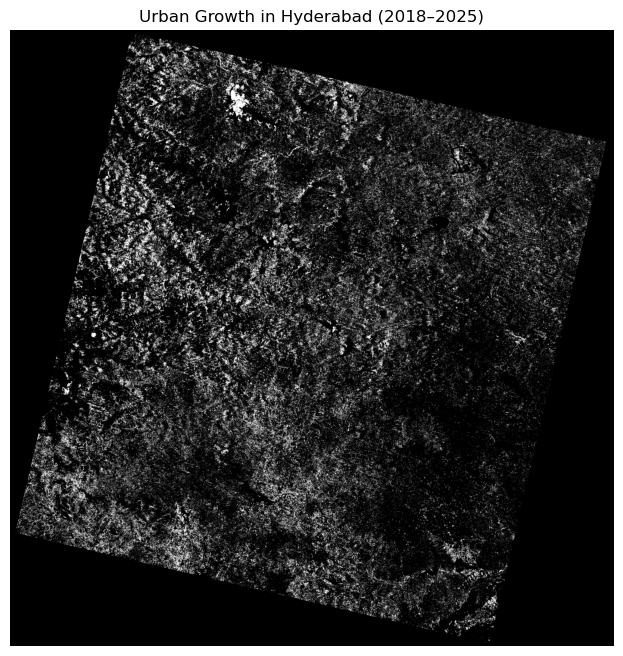

In [30]:
# Identify areas that became built-up between 2018 and 2025
urban_growth = (builtup_2018 == False) & (builtup_2025 == True)

# Display the growth map
plt.figure(figsize=(12, 8))
plt.imshow(urban_growth, cmap="gray")
plt.title("Urban Growth in Hyderabad (2018–2025)")
plt.axis("off")
plt.show()

In [31]:
growth_pixels = np.sum(urban_growth)

growth_area_km2 = growth_pixels * 0.0009

print("New built-up pixels:", growth_pixels)
print("New built-up area:", growth_area_km2, "km²")

New built-up pixels: 6212696
New built-up area: 5591.4264 km²


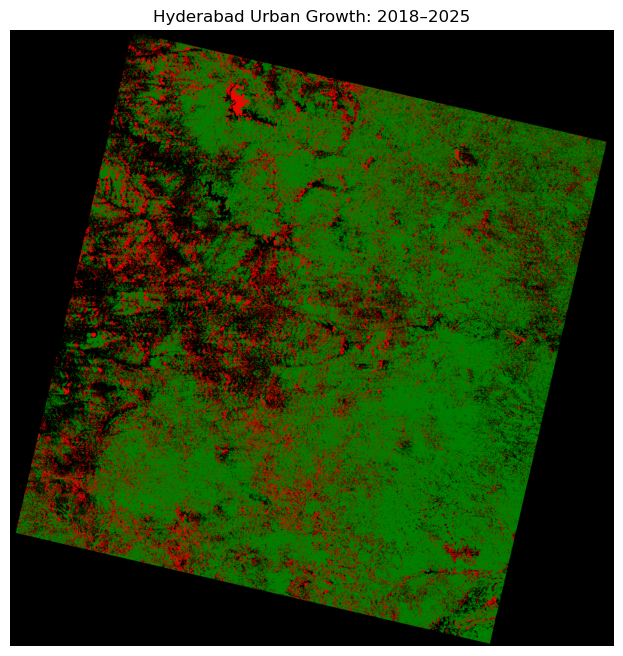

In [32]:
from matplotlib.colors import ListedColormap

# Create change map
change_map = np.zeros_like(builtup_2018, dtype=np.uint8)

# Built-up in 2018
change_map[builtup_2018] = 1

# New built-up between 2018 and 2025
change_map[urban_growth] = 2

# Create colors
cmap = ListedColormap(["black", "green", "red"])

# Display map
plt.figure(figsize=(12, 8))
plt.imshow(change_map, cmap=cmap)

plt.title("Hyderabad Urban Growth: 2018–2025")
plt.axis("off")
plt.show()

In [33]:
# Get image size
rows, cols = urban_growth.shape

# Divide the image into 10 x 10 areas
grid_rows = 10
grid_cols = 10

growth_grid = np.zeros((grid_rows, grid_cols))

row_size = rows // grid_rows
col_size = cols // grid_cols

for i in range(grid_rows):
    for j in range(grid_cols):
        
        r1 = i * row_size
        r2 = (i + 1) * row_size
        
        c1 = j * col_size
        c2 = (j + 1) * col_size
        
        growth_grid[i, j] = np.sum(urban_growth[r1:r2, c1:c2])

print("Growth grid:")
print(growth_grid)

Growth grid:
[[     0.  10076. 122517.  92259.  48714.  34073.   1498.      0.      0.
       0.]
 [     0.  25956. 101302. 100566.  91359. 113952.  77537.  63333.  36486.
   18082.]
 [     0.  86650. 100850.  61340.  95309.  84847.  94552. 105106.  76525.
   53084.]
 [     0. 109346. 152233.  87454. 125884.  68995.  84648.  86645.  97198.
   38040.]
 [  3962.  79092. 115329. 129818. 129783. 127806. 100213.  46307.  63270.
   14560.]
 [ 14345.  79753. 108895. 136325. 109470. 101290.  71176.  25706.  35901.
     689.]
 [ 50291. 103283. 102498. 110523. 137660.  84073.  42756.  17475.  16530.
       0.]
 [103101. 136463.  77926.  55101. 149904. 104709.  33748.  28733.  14319.
       0.]
 [ 24569.  79121. 123268.  89779.  82325. 109882.  42311.  70512.  13367.
       0.]
 [     0.      0.      0.    339.  18184.  45013.  49153.  50164.   5510.
       0.]]


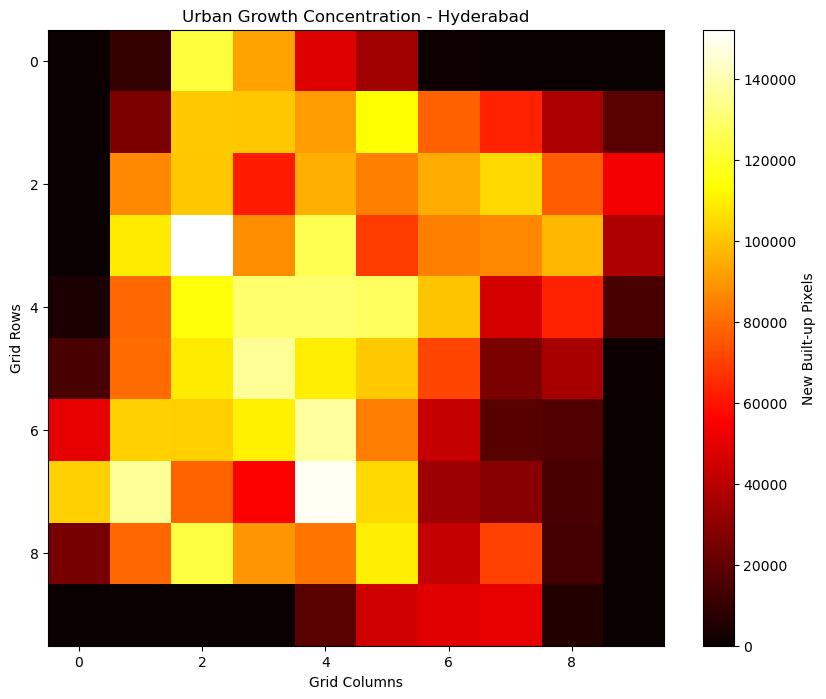

In [34]:
plt.figure(figsize=(10, 8))

plt.imshow(growth_grid, cmap="hot")
plt.colorbar(label="New Built-up Pixels")

plt.title("Urban Growth Concentration - Hyderabad")
plt.xlabel("Grid Columns")
plt.ylabel("Grid Rows")

plt.show()

In [35]:
# Get geographic bounds of the Landsat image
from rasterio.plot import plotting_extent

extent = plotting_extent(band4_2025, transform=transform_2025)

print("Image extent:", extent)

NameError: name 'band4_2025' is not defined

In [36]:
import rasterio

with rasterio.open("YOUR_2025_B4_FILE_PATH") as src:
    transform_2025 = src.transform

RasterioIOError: YOUR_2025_B4_FILE_PATH: No such file or directory

In [37]:
plt.figure(figsize=(12, 8))

plt.imshow(
    urban_growth,
    cmap="Reds",
    extent=extent
)

plt.title("Hyderabad Urban Growth (2018–2025)")
plt.xlabel("Longitude / Easting")
plt.ylabel("Latitude / Northing")
plt.colorbar(label="New Built-up Area")

plt.show()

NameError: name 'extent' is not defined

<Figure size 1200x800 with 0 Axes>

In [39]:
import rasterio
from rasterio.plot import plotting_extent
import matplotlib.pyplot as plt

file_2025_b4 = r"C:\Users\Akshara\Desktop\projects\Urban_Growth_Project\data\2025\LC08_L2SP_144048_20251226_20260106_02_T1_SR_B4.TIF"

with rasterio.open(file_2025_b4) as src:
    band4 = src.read(1)
    transform = src.transform

# Get geographic extent
extent = plotting_extent(band4, transform=transform)

print("Image shape:", band4.shape)
print("CRS:", src.crs if 'src' in locals() else "EPSG:32644")
print("Extent:", extent)



Image shape: (7841, 7681)
CRS: EPSG:32644
Extent: (89385.0, 319815.0, 1801785.0, 2037015.0)


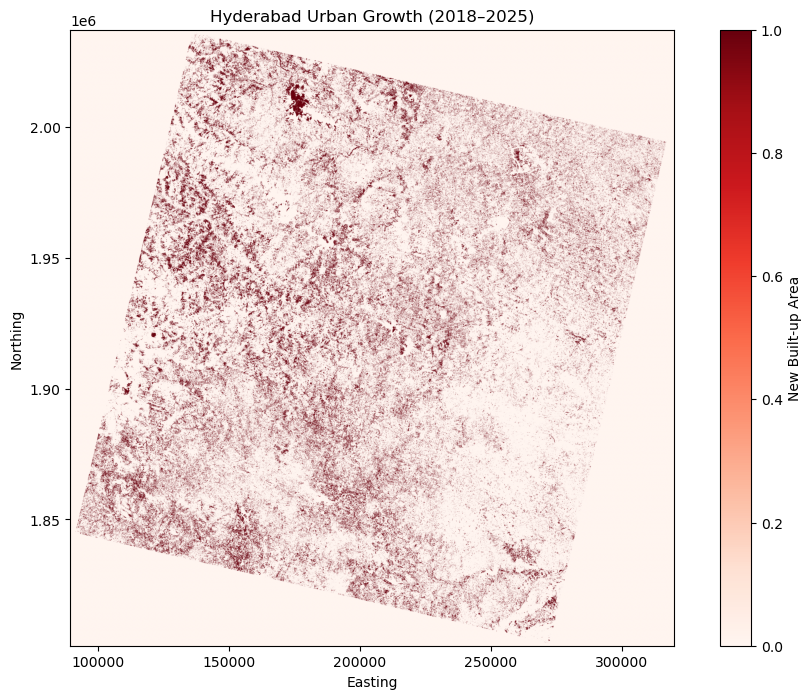

In [40]:
plt.figure(figsize=(12, 8))

plt.imshow(
    urban_growth,
    cmap="Reds",
    extent=extent
)

plt.title("Hyderabad Urban Growth (2018–2025)")
plt.xlabel("Easting")
plt.ylabel("Northing")
plt.colorbar(label="New Built-up Area")

plt.show()

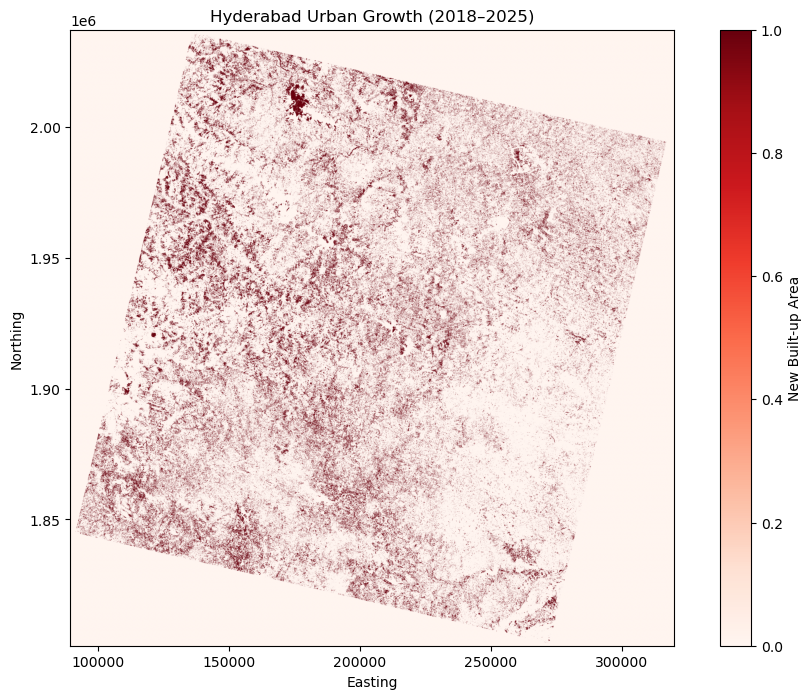

In [41]:
plt.figure(figsize=(12, 8))

plt.imshow(
    urban_growth,
    cmap="Reds",
    extent=extent
)

plt.title("Hyderabad Urban Growth (2018–2025)")
plt.xlabel("Easting")
plt.ylabel("Northing")
plt.colorbar(label="New Built-up Area")

plt.show()

In [42]:
from rasterio.windows import from_bounds

# Hyderabad study-area test box
left = 230000
right = 300000
bottom = 1850000
top = 1955000

window = from_bounds(
    left,
    bottom,
    right,
    top,
    transform=src.transform
)

print("Rows:", int(window.height))
print("Columns:", int(window.width))

Rows: 3499
Columns: 2333


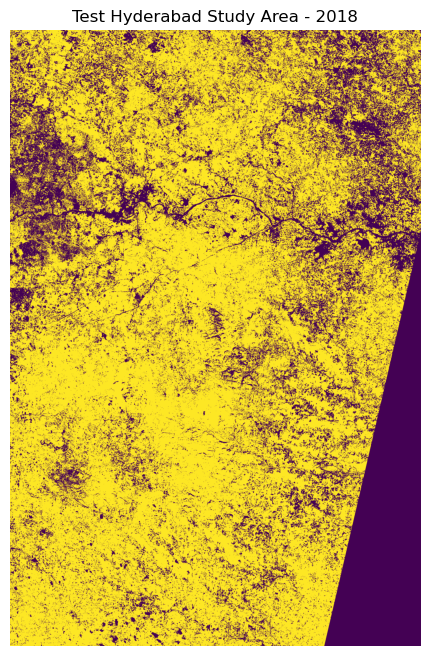

In [43]:
import matplotlib.pyplot as plt

cropped_2018 = builtup_2018[
    int(window.row_off):int(window.row_off + window.height),
    int(window.col_off):int(window.col_off + window.width)
]

plt.figure(figsize=(8, 8))
plt.imshow(cropped_2018)
plt.title("Test Hyderabad Study Area - 2018")
plt.axis("off")
plt.show()

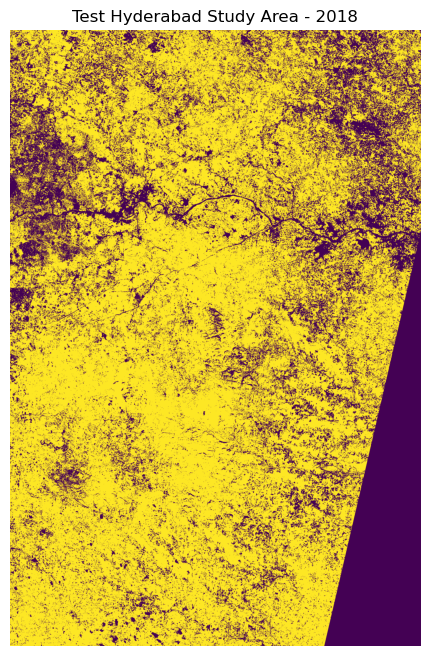

In [44]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
plt.imshow(cropped_2018)
plt.title("Test Hyderabad Study Area - 2018")
plt.axis("off")
plt.show()

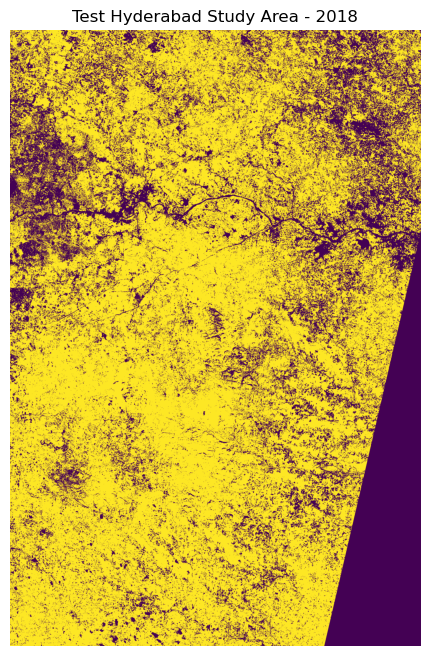

In [45]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 8))
plt.imshow(cropped_2018)
plt.title("Test Hyderabad Study Area - 2018")
plt.axis("off")
plt.show()

In [46]:
print("Built-up pixels:", cropped_2018.sum())
print("Total pixels:", cropped_2018.size)

percentage = (cropped_2018.sum() / cropped_2018.size) * 100
print("Built-up percentage:", percentage)

Built-up pixels: 5668489
Total pixels: 8165500
Built-up percentage: 69.41998652868777


In [48]:
print("Status:", response.status_code)
print("Content type:", response.headers.get("content-type"))
print("Response:")
print(response.text[:500])

Status: 400
Content type: None
Response:
<html>
<head>
<title>
Error: Output format not supported.</title>
<link href="/arcgis/rest/static/main.css" rel="stylesheet" type="text/css"/>
</head>
<body>
<table width="100%" class="userTable">
<tr>
<td class="titlecell">ArcGIS REST Framework</td>
</tr>
</table>
<table width="100%" class="navTable">
<tr valign="top">
<td class="breadcrumbs">
<a href="/arcgis/rest/services">Home</a>
</td>
</tr>
</table>
<div class="cbody">
<br/>
<br/>
<b>Error: </b>Output format not suppo


In [49]:
import requests

url = "https://tgrac.telangana.gov.in/arcgis/rest/services/RRR_Folder/RRR/MapServer/83/query"

params = {
    "where": "DISTRICT_N = 'Hyderabad'",
    "outFields": "*",
    "returnGeometry": "true",
    "outSR": "32644",
    "f": "json"
}

response = requests.get(url, params=params)

print("Status:", response.status_code)
print(response.text[:300])

Status: 200
{"displayFieldName":"STATE","fieldAliases":{"FID":"FID","OBJECTID_1":"OBJECTID_1","STATE":"STATE","DISTRICT_N":"DISTRICT_N","Shape_Leng":"Shape_Leng","Shape_Area":"Shape_Area"},"geometryType":"esriGeometryPolygon","spatialReference":{"wkid":32644,"latestWkid":32644},"fields":[{"name":"FID","type":"e


In [52]:
import geopandas as gpd
from shapely.geometry import Polygon, MultiPolygon

data = response.json()

features = []

for feature in data["features"]:
    geom = feature.get("geometry")

    if geom is None:
        continue

    rings = geom.get("rings", [])

    if len(rings) == 0:
        continue

    polygons = []

    for ring in rings:
        if len(ring) >= 3:
            polygons.append(Polygon(ring))

    if len(polygons) == 1:
        geometry = polygons[0]
    else:
        geometry = MultiPolygon(polygons)

    attributes = feature.get("attributes", {})

    features.append({
        **attributes,
        "geometry": geometry
    })

hyderabad = gpd.GeoDataFrame(
    features,
    geometry="geometry",
    crs="EPSG:32644"
)

print("Number of polygons:", len(hyderabad))
print("CRS:", hyderabad.crs)
print(hyderabad[["DISTRICT_N", "geometry"]])



Number of polygons: 1
CRS: EPSG:32644
  DISTRICT_N                                           geometry
0  Hyderabad  POLYGON ((235303.363 1934817.28, 235513.357 19...


In [53]:
from rasterio.features import geometry_mask

# Make sure Hyderabad boundary uses the same CRS as the raster
hyderabad = hyderabad.to_crs(src.crs)

aoi_mask = geometry_mask(
    hyderabad.geometry,
    transform=src.transform,
    invert=True,
    out_shape=builtup_2018.shape
)

print("Hyderabad pixels:", aoi_mask.sum())
print("Total raster pixels:", aoi_mask.size)

percentage = (aoi_mask.sum() / aoi_mask.size) * 100
print("Hyderabad area percentage of raster:", percentage)

Hyderabad pixels: 202918
Total raster pixels: 60226721
Hyderabad area percentage of raster: 0.33692353930409064


In [54]:
# Apply Hyderabad boundary to 2018 and 2025 built-up masks

builtup_2018_hyd = builtup_2018 & aoi_mask
builtup_2025_hyd = builtup_2025 & aoi_mask

print("2018 Hyderabad built-up pixels:", builtup_2018_hyd.sum())
print("2025 Hyderabad built-up pixels:", builtup_2025_hyd.sum())

2018 Hyderabad built-up pixels: 79659
2025 Hyderabad built-up pixels: 89279


In [55]:
# 30 m × 30 m pixel
pixel_area_km2 = (30 * 30) / 1_000_000

area_2018_km2 = builtup_2018_hyd.sum() * pixel_area_km2
area_2025_km2 = builtup_2025_hyd.sum() * pixel_area_km2

new_builtup_km2 = area_2025_km2 - area_2018_km2

urban_growth_percent = (
    new_builtup_km2 / area_2018_km2
) * 100

print("2018 Built-up Area:", area_2018_km2, "km²")
print("2025 Built-up Area:", area_2025_km2, "km²")
print("New Built-up Area:", new_builtup_km2, "km²")
print("Urban Growth:", urban_growth_percent, "%")



2018 Built-up Area: 71.6931 km²
2025 Built-up Area: 80.3511 km²
New Built-up Area: 8.658000000000001 km²
Urban Growth: 12.076475978859893 %


In [58]:
import os
import pandas as pd

# Create results folder if it doesn't exist
os.makedirs("outputs/results", exist_ok=True)

results = pd.DataFrame({
    "Metric": [
        "2018 Built-up Area",
        "2025 Built-up Area",
        "New Built-up Area",
        "Urban Growth"
    ],
    "Value": [
        area_2018_km2,
        area_2025_km2,
        new_builtup_km2,
        urban_growth_percent
    ],
    "Unit": [
        "km²",
        "km²",
        "km²",
        "%"
    ]
})

# Save CSV
results.to_csv(
    "outputs/results/hyderabad_urban_growth_results.csv",
    index=False
)

print(results)
print("\n✅ Corrected results CSV saved!")

               Metric      Value Unit
0  2018 Built-up Area  71.693100  km²
1  2025 Built-up Area  80.351100  km²
2   New Built-up Area   8.658000  km²
3        Urban Growth  12.076476    %

✅ Corrected results CSV saved!


In [59]:
import pandas as pd

results = pd.DataFrame({
    "Metric": [
        "2018 Built-up Area",
        "2025 Built-up Area",
        "New Built-up Area",
        "Urban Growth"
    ],
    "Value": [
        area_2018_km2,
        area_2025_km2,
        new_builtup_km2,
        urban_growth_percent
    ],
    "Unit": [
        "km²",
        "km²",
        "km²",
        "%"
    ]
})

results.to_csv(
    "outputs/results/hyderabad_urban_growth_results.csv",
    index=False
)

print(results)
print("\nCorrected results CSV saved!")

               Metric      Value Unit
0  2018 Built-up Area  71.693100  km²
1  2025 Built-up Area  80.351100  km²
2   New Built-up Area   8.658000  km²
3        Urban Growth  12.076476    %

Corrected results CSV saved!


In [61]:
import os
import pandas as pd

os.makedirs("outputs/results", exist_ok=True)

results = pd.DataFrame({
    "Metric": [
        "2018 Built-up Area",
        "2025 Built-up Area",
        "New Built-up Area",
        "Urban Growth"
    ],
    "Value": [
        area_2018_km2,
        area_2025_km2,
        new_builtup_km2,
        urban_growth_percent
    ],
    "Unit": [
        "km²",
        "km²",
        "km²",
        "%"
    ]
})

results.to_csv(
    "outputs/results/hyderabad_urban_growth_results.csv",
    index=False
)

print(results)
print("\n✅ Corrected results CSV saved!")

               Metric      Value Unit
0  2018 Built-up Area  71.693100  km²
1  2025 Built-up Area  80.351100  km²
2   New Built-up Area   8.658000  km²
3        Urban Growth  12.076476    %

✅ Corrected results CSV saved!


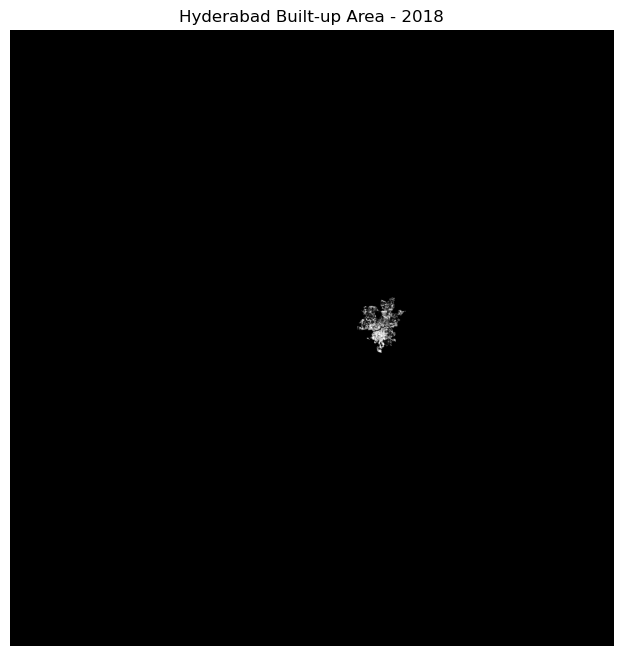

✅ 2018 map saved!


In [64]:
import os
import matplotlib.pyplot as plt

# Create maps folder
os.makedirs("outputs/maps", exist_ok=True)

# 2018 Hyderabad built-up map
plt.figure(figsize=(10, 8))

plt.imshow(builtup_2018_hyd, cmap="gray")
plt.title("Hyderabad Built-up Area - 2018")
plt.axis("off")

plt.savefig(
    "outputs/maps/hyderabad_builtup_2018.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("✅ 2018 map saved!")

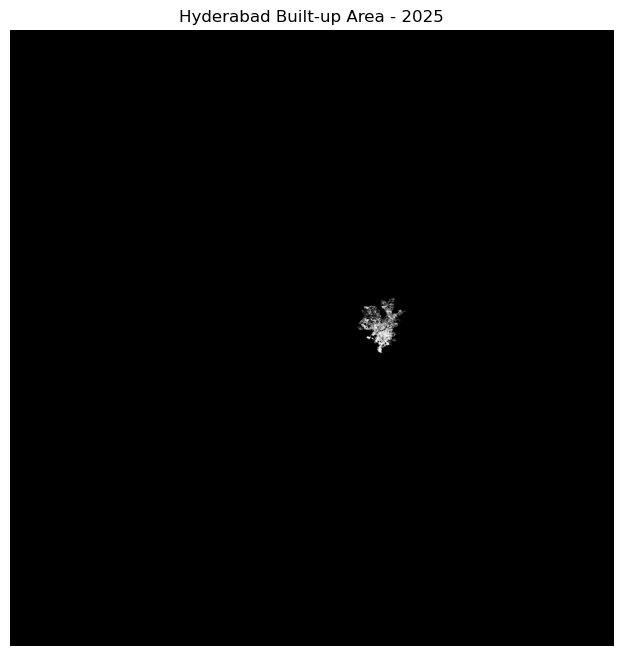

2025 map saved!


In [65]:
# 2025 Hyderabad built-up map
plt.figure(figsize=(10, 8))
plt.imshow(builtup_2025_hyd, cmap="gray")
plt.title("Hyderabad Built-up Area - 2025")
plt.axis("off")

plt.savefig(
    "outputs/maps/hyderabad_builtup_2025.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("2025 map saved!")

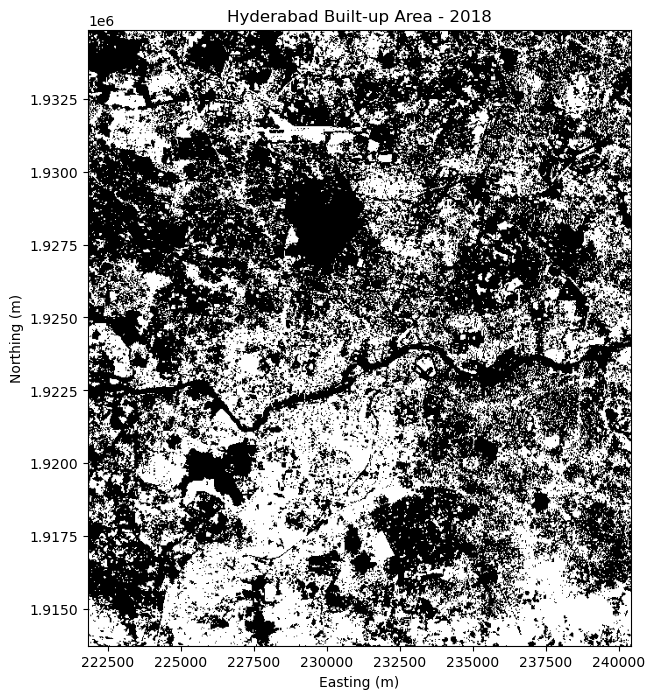

In [66]:
import matplotlib.pyplot as plt

minx, miny, maxx, maxy = hyderabad.total_bounds

plt.figure(figsize=(10, 8))

plt.imshow(
    builtup_2018,
    extent=[
        src.bounds.left,
        src.bounds.right,
        src.bounds.bottom,
        src.bounds.top
    ],
    cmap="gray"
)

plt.xlim(minx, maxx)
plt.ylim(miny, maxy)

plt.title("Hyderabad Built-up Area - 2018")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")

plt.savefig(
    "outputs/maps/hyderabad_builtup_2018.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

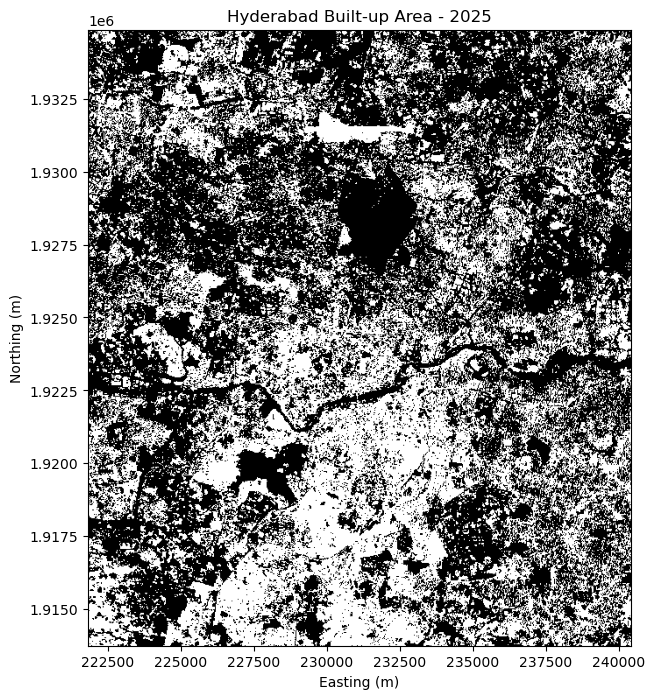

In [67]:
plt.figure(figsize=(10, 8))

plt.imshow(
    builtup_2025,
    extent=[
        src.bounds.left,
        src.bounds.right,
        src.bounds.bottom,
        src.bounds.top
    ],
    cmap="gray"
)

plt.xlim(minx, maxx)
plt.ylim(miny, maxy)

plt.title("Hyderabad Built-up Area - 2025")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")

plt.savefig(
    "outputs/maps/hyderabad_builtup_2025.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [69]:
import numpy as np

# Create urban growth/change map
growth_map = np.zeros_like(builtup_2018, dtype=np.uint8)

# 1 = New built-up area
growth_map[(builtup_2018 == 0) & (builtup_2025 == 1)] = 1

# 2 = Built-up in both years
growth_map[(builtup_2018 == 1) & (builtup_2025 == 1)] = 2

# 3 = Lost built-up area
growth_map[(builtup_2018 == 1) & (builtup_2025 == 0)] = 3

print("Growth map created!")
print("Shape:", growth_map.shape)
print("Unique values:", np.unique(growth_map))



Growth map created!
Shape: (7841, 7681)
Unique values: [0 1 2 3]


Cropped growth map shape: (703, 620)


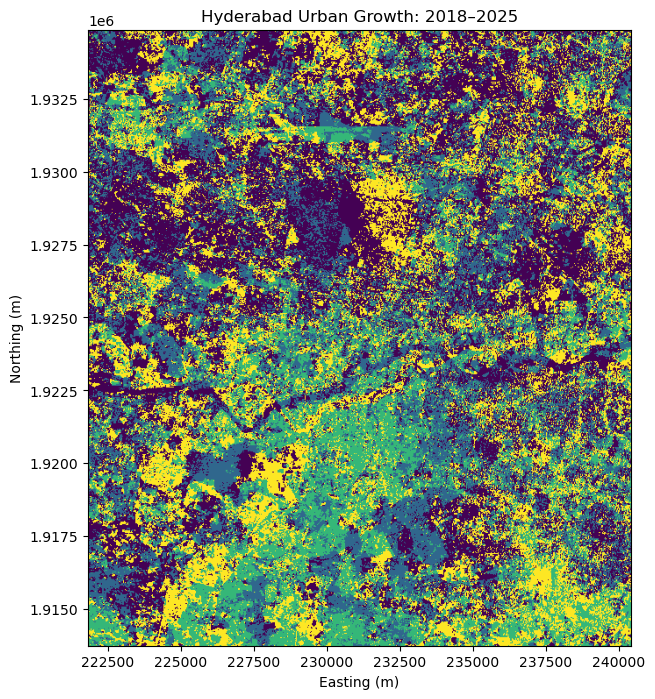

✅ Zoomed urban growth map saved!


In [70]:
import os
import matplotlib.pyplot as plt
from rasterio.windows import from_bounds

os.makedirs("outputs/maps", exist_ok=True)

# Get Hyderabad boundary
minx, miny, maxx, maxy = hyderabad.total_bounds

# Convert Hyderabad boundary to raster window
window = from_bounds(
    minx, miny,
    maxx, maxy,
    transform=src.transform
)

# Convert window coordinates to integers
row_start = int(window.row_off)
row_end = int(window.row_off + window.height)
col_start = int(window.col_off)
col_end = int(window.col_off + window.width)

# Crop growth map to Hyderabad
growth_map_hyd = growth_map[
    row_start:row_end,
    col_start:col_end
]

print("Cropped growth map shape:", growth_map_hyd.shape)

# Plot
plt.figure(figsize=(10, 8))

plt.imshow(
    growth_map_hyd,
    extent=[minx, maxx, miny, maxy]
)

plt.title("Hyderabad Urban Growth: 2018–2025")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")

plt.savefig(
    "outputs/maps/hyderabad_urban_growth_2018_2025.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("✅ Zoomed urban growth map saved!")

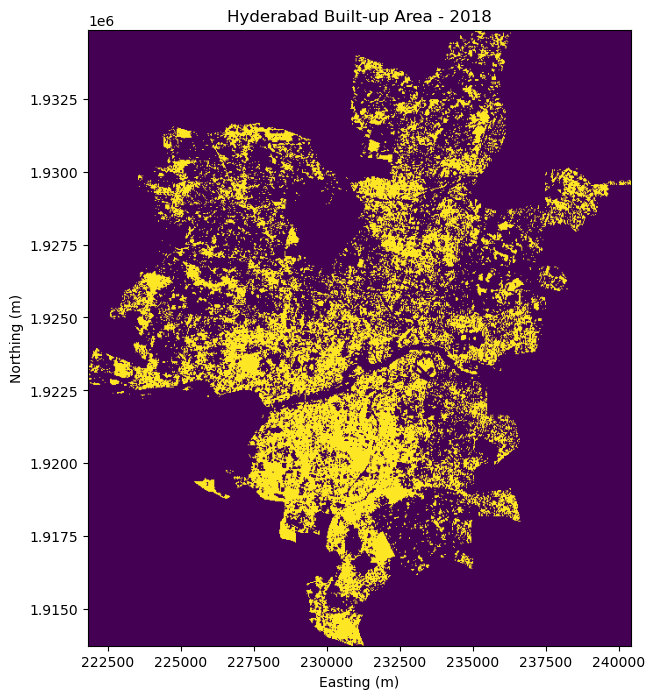

✅ 2018 Hyderabad built-up map saved!


In [71]:
import matplotlib.pyplot as plt
from rasterio.windows import from_bounds

# Hyderabad boundary
minx, miny, maxx, maxy = hyderabad.total_bounds

# Create raster window for Hyderabad
window = from_bounds(
    minx, miny,
    maxx, maxy,
    transform=src.transform
)

row_start = int(window.row_off)
row_end = int(window.row_off + window.height)
col_start = int(window.col_off)
col_end = int(window.col_off + window.width)

# Crop 2018 built-up map
builtup_2018_zoom = builtup_2018_hyd[
    row_start:row_end,
    col_start:col_end
]

# Plot
plt.figure(figsize=(10, 8))

plt.imshow(
    builtup_2018_zoom,
    extent=[minx, maxx, miny, maxy]
)

plt.title("Hyderabad Built-up Area - 2018")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")

plt.savefig(
    "outputs/maps/hyderabad_builtup_2018.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("✅ 2018 Hyderabad built-up map saved!")

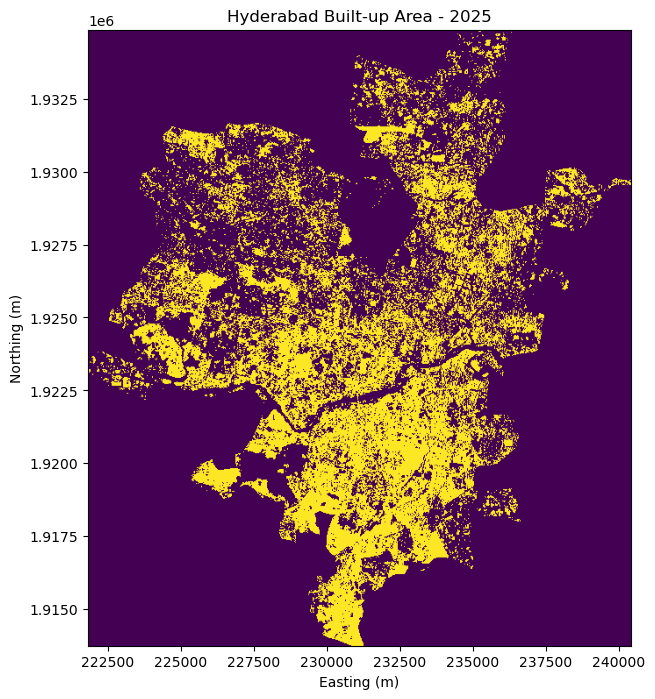

✅ 2025 Hyderabad built-up map saved!


In [72]:
import matplotlib.pyplot as plt
from rasterio.windows import from_bounds

# Hyderabad boundary
minx, miny, maxx, maxy = hyderabad.total_bounds

# Create raster window
window = from_bounds(
    minx, miny,
    maxx, maxy,
    transform=src.transform
)

row_start = int(window.row_off)
row_end = int(window.row_off + window.height)
col_start = int(window.col_off)
col_end = int(window.col_off + window.width)

# Crop 2025 built-up map
builtup_2025_zoom = builtup_2025_hyd[
    row_start:row_end,
    col_start:col_end
]

# Plot
plt.figure(figsize=(10, 8))

plt.imshow(
    builtup_2025_zoom,
    extent=[minx, maxx, miny, maxy]
)

plt.title("Hyderabad Built-up Area - 2025")
plt.xlabel("Easting (m)")
plt.ylabel("Northing (m)")

plt.savefig(
    "outputs/maps/hyderabad_builtup_2025.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("✅ 2025 Hyderabad built-up map saved!")

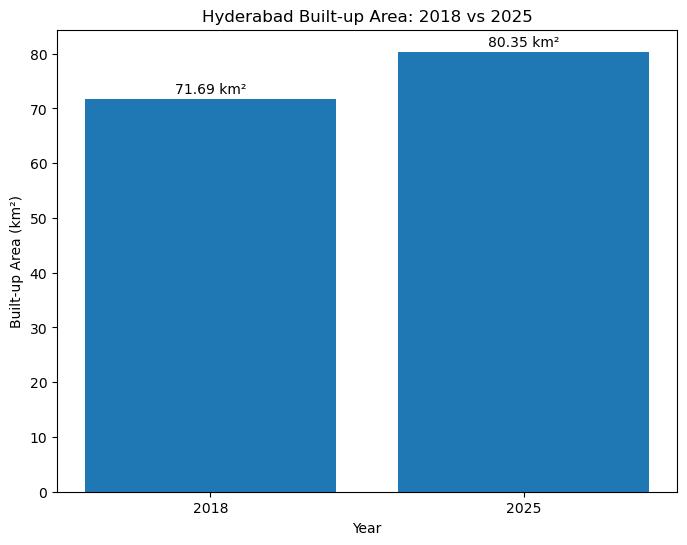

✅ Built-up area comparison graph saved!


In [74]:
import os
import matplotlib.pyplot as plt

# Create graphs folder
os.makedirs("outputs/graphs", exist_ok=True)

# Built-up area values
years = ["2018", "2025"]
areas = [area_2018_km2, area_2025_km2]

# Create graph
plt.figure(figsize=(8, 6))

plt.bar(years, areas)

plt.title("Hyderabad Built-up Area: 2018 vs 2025")
plt.xlabel("Year")
plt.ylabel("Built-up Area (km²)")

# Show values on bars
for i, value in enumerate(areas):
    plt.text(
        i,
        value + 1,
        f"{value:.2f} km²",
        ha="center"
    )

plt.savefig(
    "outputs/graphs/hyderabad_builtup_area_comparison.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("✅ Built-up area comparison graph saved!")

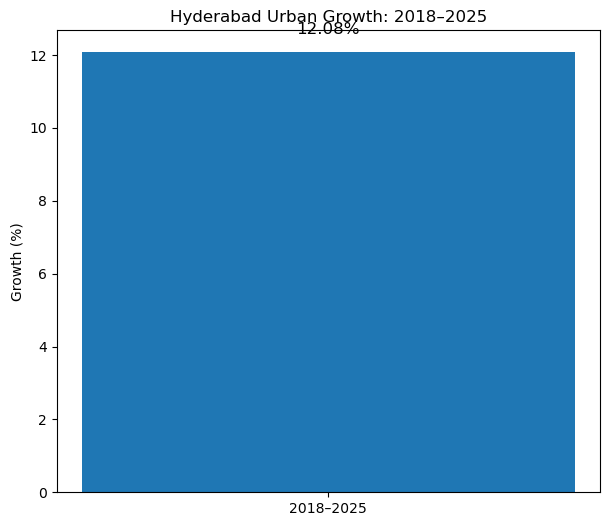

Urban growth: 12.08%
✅ Urban growth percentage graph saved!


In [75]:
import matplotlib.pyplot as plt

growth = urban_growth_percent

plt.figure(figsize=(7, 6))

plt.bar(["2018–2025"], [growth])

plt.title("Hyderabad Urban Growth: 2018–2025")
plt.ylabel("Growth (%)")

plt.text(
    0,
    growth + 0.5,
    f"{growth:.2f}%",
    ha="center",
    fontsize=12
)

plt.savefig(
    "outputs/graphs/hyderabad_urban_growth_percentage.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print(f"Urban growth: {growth:.2f}%")
print("✅ Urban growth percentage graph saved!")

In [79]:
import matplotlib.pyplot as plt

# Feature names used by the Random Forest
feature_names = ["Red", "NIR", "SWIR", "NDVI", "NDBI"]

# Get feature importance
importances = rf_model.feature_importances_

# Create graph
plt.figure(figsize=(8, 6))

plt.bar(feature_names, importances)

plt.title("Random Forest Feature Importance")
plt.xlabel("Satellite Feature")
plt.ylabel("Importance")

plt.savefig(
    "outputs/graphs/ml_feature_importance.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

print("Feature importances:")
for name, importance in zip(feature_names, importances):
    print(f"{name}: {importance:.4f}")

print("✅ Feature importance graph saved!")



NotFittedError: This RandomForestClassifier instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

In [80]:
import pandas as pd

final_results = pd.DataFrame({
    "Metric": [
        "2018 Built-up Area",
        "2025 Built-up Area",
        "Net Built-up Increase",
        "Urban Growth"
    ],
    "Value": [
        area_2018_km2,
        area_2025_km2,
        new_builtup_km2,
        urban_growth_percent
    ],
    "Unit": [
        "km²",
        "km²",
        "km²",
        "%"
    ]
})

# Display results
display(final_results)

# Save results
final_results.to_csv(
    "outputs/results/final_hyderabad_results.csv",
    index=False
)

print("✅ Final results table saved!")

,Metric,Value,Unit
0,2018 Built-up Area,71.693100,km²
1,2025 Built-up Area,80.351100,km²
2,Net Built-up Increase,8.658000,km²
3,Urban Growth,12.076476,%


✅ Final results table saved!


In [81]:
import os

print("MAPS:")
print(os.listdir("outputs/maps"))

print("\nGRAPHS:")
print(os.listdir("outputs/graphs"))

print("\nRESULTS:")
print(os.listdir("outputs/results"))

MAPS:
['hyderabad_builtup_2018.png', 'hyderabad_builtup_2025.png', 'hyderabad_urban_growth_2018_2025.png']

GRAPHS:
['hyderabad_builtup_area_comparison.png', 'hyderabad_urban_growth_percentage.png']

RESULTS:
['final_hyderabad_results.csv', 'hyderabad_urban_growth_results.csv']
